In [1332]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm,Normalize
import seaborn as sns
from matplotlib import rc
import scipy.interpolate as interp

In [1333]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [1334]:
def get_density(vals, bins=30, kind="linear"):
    y, bin_edges = np.histogram(vals, bins=bins, density=True)
    x = (bin_edges[1:] + bin_edges[:-1])/2.
    f = interp.interp1d(x, y, kind=kind, fill_value="extrapolate")
    return f(vals)

In [1335]:
bin_fle = pd.read_csv('tzpz_bin_data.csv',sep=' ')

In [1336]:
bin_fle

,Bin,N_G,z_true_mean_G,z_phot_mean_G,N_R,z_true_mean_R,z_phot_mean_R,fout,COR_Outlier_Bias
0,0.05,510,0.076863,0.085455,18,0.219213,0.080078,0.035294,0.128819
1,0.15,1417,0.163771,0.169205,55,0.265172,0.163151,0.038814,0.087711
2,0.25,5062,0.252976,0.259735,203,0.422421,0.260562,0.040103,0.128402
3,0.35,6087,0.353510,0.362201,340,0.440004,0.352839,0.055857,0.064431
4,0.45,7043,0.450704,0.435872,494,0.340796,0.465696,0.070141,-0.085216
5,0.55,6672,0.551808,0.542557,237,0.318647,0.530775,0.035522,-0.138576
6,0.65,6908,0.647815,0.647109,12,0.777474,0.651017,0.001737,0.076593
7,0.75,7782,0.750480,0.753455,35,0.869637,0.754731,0.004498,0.065483
8,0.85,6535,0.848409,0.845089,55,0.787105,0.855449,0.008416,-0.036834
9,0.95,6103,0.947165,0.946239,43,1.208204,0.962008,0.007046,0.125482


In [1337]:
red = pd.read_csv('tzpz_plotting_data_COR_red.csv',sep=' ')
grey= pd.read_csv('tzpz_plotting_data_COR_gray.csv',sep=' ')

In [1338]:
red.columns = ['z_phot','z_true','COR_val']
red = red[['z_true','z_phot','COR_val']]

In [1339]:
# Sorting by z_true value
red = red.sort_values('z_true')
grey = grey.sort_values('z_true')

In [1340]:
print(len(grey),'\n',len(red))

89621 
 3478


In [1341]:
red.head(1)

,z_true,z_phot,COR_val
0,0.014823,0.252435,-0.237612


In [1342]:
grey.head(1)

,z_true,z_phot,COR_val
0,0.014823,0.252435,-0.237612


Text(0.5, 1.0, 'Red Data')

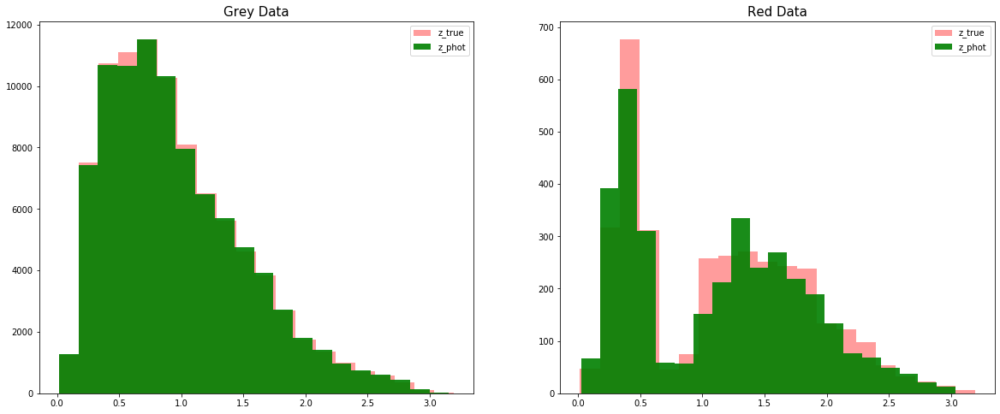

In [1343]:
plt.rcParams['figure.figsize'] = [20,8]
plt.subplot(1,2,1)
plt.hist(grey['z_true'],bins=20,alpha=0.39,color='r',label='z_true')
plt.hist(grey['z_phot'],alpha=0.9,bins=20,color='green',label='z_phot');
plt.title('Grey Data',fontsize=15)
plt.legend()
plt.subplot(1,2,2)
plt.hist(red['z_true'],bins=20,alpha=0.39,color='r',label='z_true')
plt.hist(red['z_phot'],alpha=0.9,bins=20,color='green',label='z_phot');
plt.legend()
plt.title('Red Data',fontsize=15)

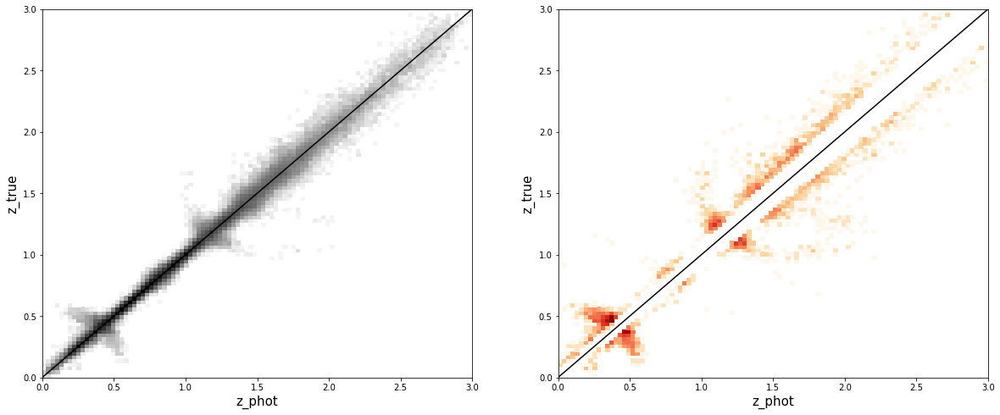

In [1344]:
plt.rcParams['figure.figsize'] = [20,8] 
plt.subplot(1,2,1)
tx = np.where( grey.z_phot > 0.0 )[0]

plt.hist2d( grey.z_phot[tx], grey.z_true[tx], bins=100, range=[[0.0,3.0],[0.0,3.0]], norm=LogNorm(clip=True), \
            cmin=1, cmap='Greys');
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)

plt.plot([0.0,3.0],[0.0,3.0],color='black')

plt.subplot(1,2,2)
tx = np.where( red.z_phot > 0.0 )[0]
plt.hist2d( red.z_phot[tx], red.z_true[tx], bins=100, range=[[0.0,3.0],[0.0,3.0]], norm=LogNorm(clip=True), \
            cmin=1, cmap='OrRd');

#plt.plot(red.z_phot,red.z_true,'o',c='r',alpha=0.5)
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)

plt.plot([0.0,3.0],[0.0,3.0],color='black')

### Now we will chop off the data files, with $z = [0, 1.5]$

In [1345]:
red = red[red['z_true']<=1.2]
grey = grey[grey['z_true']<=1.2]

In [1346]:
print(len(grey),'\n',len(red))

63524 
 1788


Text(0.5, 1.0, 'Red Data')

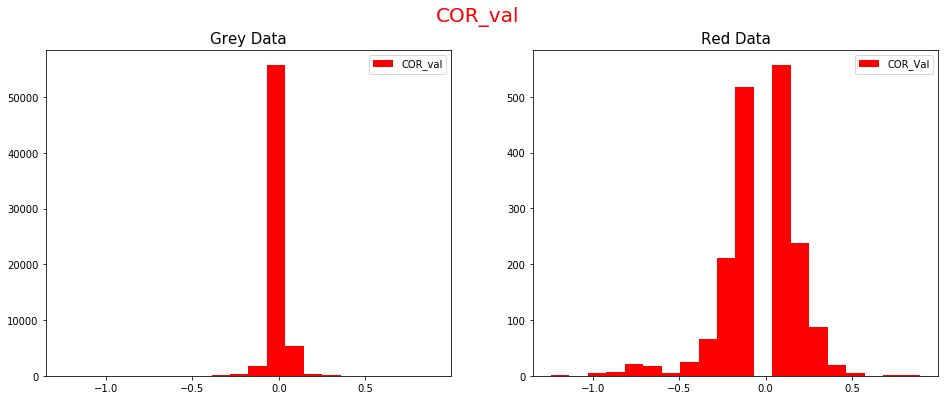

In [1347]:
plt.rcParams['figure.figsize'] = [16,6]
plt.subplot(1,2,1)
plt.hist(grey['z_true']-grey['z_phot'],bins=20,color='r',label='COR_val')
plt.title('Grey Data',fontsize=15)
plt.suptitle('COR_val',fontsize=20,color='red')
plt.legend()
plt.subplot(1,2,2)
plt.hist(red['z_true']-red['z_phot'],bins=20,color='r',label='COR_Val')
plt.legend()
plt.title('Red Data',fontsize=15)

Text(0.5, 1.0, 'Red Data')

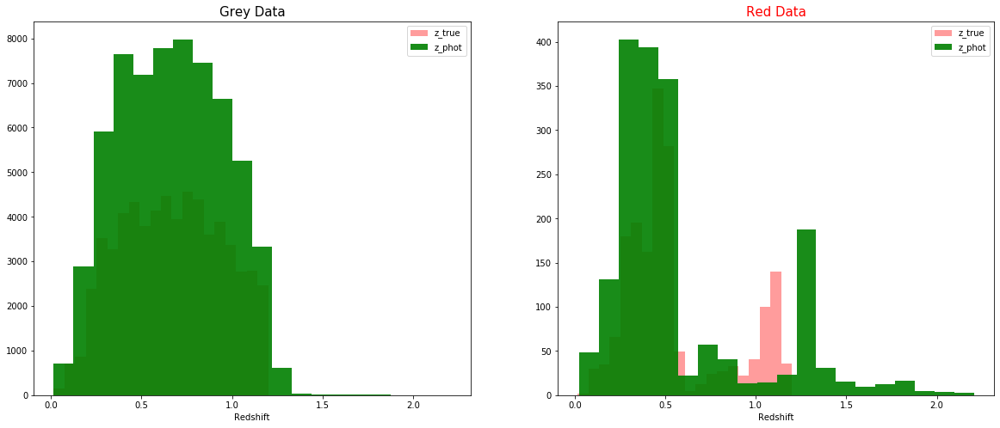

In [1348]:
plt.rcParams['figure.figsize'] = [20,8]
plt.subplot(1,2,1)
plt.hist(grey['z_true'],bins=20,alpha=0.39,color='r',label='z_true')
plt.hist(grey['z_phot'],alpha=0.9,bins=20,color='green',label='z_phot');
plt.title('Grey Data',fontsize=15)
plt.legend()
plt.xlabel('Redshift')
plt.subplot(1,2,2)
plt.hist(red['z_true'],bins=20,alpha=0.39,color='r',label='z_true')
plt.hist(red['z_phot'],alpha=0.9,bins=20,color='green',label='z_phot');
plt.legend()
plt.xlabel('Redshift')
plt.title('Red Data',fontsize=15,color='r')

(0, 1.2)

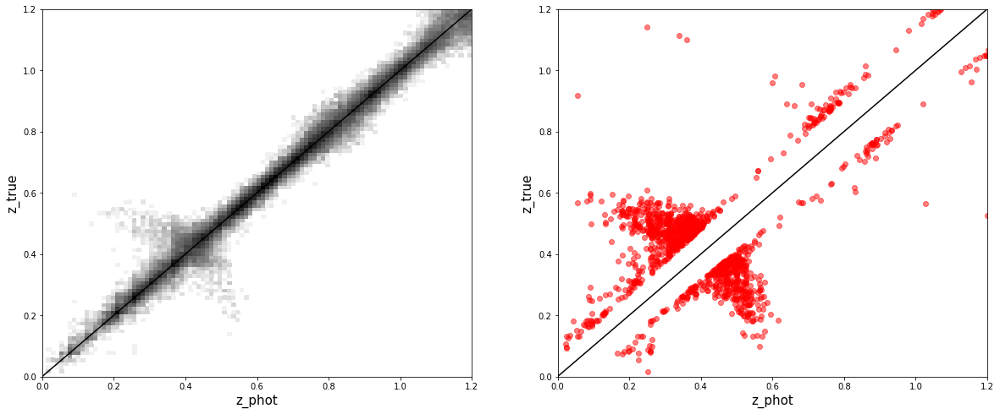

In [1349]:
plt.rcParams['figure.figsize'] = [20,8] 
plt.subplot(1,2,1)
tx = np.where( grey.z_phot > 0.0 )[0]

plt.hist2d( grey.z_phot[tx], grey.z_true[tx], bins=100, range=[[0.0,1.2],[0.0,1.2]], norm=LogNorm(clip=True), \
            cmin=1, cmap='Greys');
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)

plt.plot([0.0,1.2],[0.0,1.2],color='black')

plt.subplot(1,2,2)
txx = np.where( red.z_phot > 0.0 )[0]
plt.plot([0.0,1.2],[0.0,1.2],color='black')
plt.plot(red.z_phot,red.z_true,'o',c='r',alpha=0.5)
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)
plt.xlim(0,1.2)
plt.ylim(0,1.2)

### The above plots are forced within the axes limits of $[0, 1.2]$. It doesn't capture the full image. We can see that although we have refined the dataset, $z_{spectro} \le 1.2$ , the $photo\_z$ values well exced the $1.2$ range. This can be seen from the summary statistics described below.  

### Summary Statistics of the two datasets. Specially to check the <font color='red'>min</font>  and <font color='blue'>max</font>  values of the photo_z column.

In [1350]:
print('Grey     Red')
display_side_by_side(grey.describe(),red.describe())

Grey     Red


,z_true,z_phot,COR_val
count,63524.000000,63524.000000,63524.000000
mean,0.668945,0.669555,-0.000611
std,0.279596,0.285787,0.048215
min,0.014823,0.014874,-1.242432
25%,0.441927,0.436160,-0.014416
50%,0.667531,0.665853,0.000409
75%,0.893365,0.892968,0.015576
max,1.199976,2.207569,0.892143
,z_true,z_phot,COR_val
count,1788.000000,1788.000000,1788.000000


#### Checking the corresponding $z\_spectro$ value of the maximum $z\_photo$ value

In [1351]:
red.loc[red['z_phot'] == np.max(red['z_phot'])] # 2.207569

,z_true,z_phot,COR_val
1471,0.965137,2.207569,-1.242432


#### Plotting the above maximum point

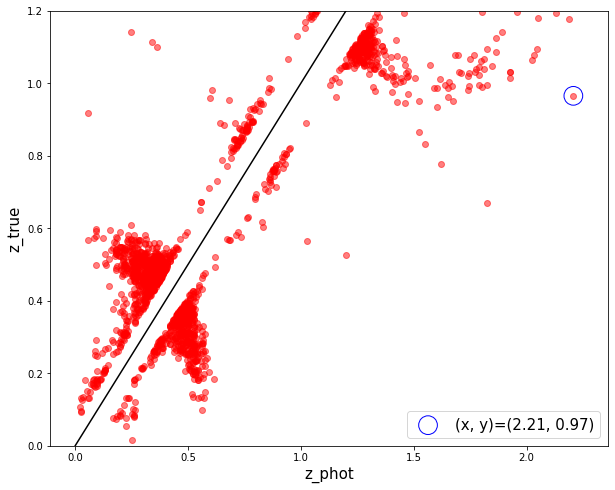

In [1352]:
x = red.loc[red['z_phot'] == np.max(red['z_phot'])].z_phot
y = red.loc[red['z_phot'] == np.max(red['z_phot'])].z_true
plt.rcParams['figure.figsize'] = [10,8]
txx = np.where( red.z_phot > 0.0 )[0]
plt.plot([0.0,1.2],[0.0,1.2],color='black')
plt.plot(red.z_phot,red.z_true,'o',c='r',alpha=0.5)
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)
plt.scatter(x,y,s=350,facecolors='none', edgecolors='b',label = '(x, y)=(%.2f, %.2f)'%(x,y))
#plt.xlim(0,1.2)
plt.ylim(0,1.2)
plt.legend(fontsize=15)

### Further Refining out points, based on $z\_photo$ condition. 

In [1353]:
red = red[red['z_phot']<1.2001]
grey = grey[grey['z_phot']<=1.2001]

In [1354]:
print('Grey     Red')
display_side_by_side(grey.describe(),red.describe())

Grey     Red


,z_true,z_phot,COR_val
count,62410.000000,62410.000000,62410.000000
mean,0.660601,0.658791,0.001810
std,0.274841,0.276081,0.039154
min,0.014823,0.014874,-0.465720
25%,0.437672,0.432958,-0.013359
50%,0.658737,0.657177,0.000842
75%,0.879968,0.879237,0.015946
max,1.199952,1.200022,0.892143
,z_true,z_phot,COR_val
count,1492.000000,1492.000000,1492.000000


In [1355]:
print(grey.loc[grey['z_true'] == np.max(grey['z_true'])] )
print(grey.loc[grey['z_phot'] == np.max(grey['z_phot'])] )

         z_true    z_phot   COR_val
63522  1.199952  1.173079  0.026873
         z_true    z_phot   COR_val
63488  1.198991  1.200022 -0.001031


In [1356]:
print(red.loc[red['z_true'] == np.max(red['z_true'])] )
print(red.loc[red['z_phot'] == np.max(red['z_phot'])] )

        z_true   z_phot   COR_val
1787  1.199801  1.06668  0.133121
        z_true    z_phot   COR_val
1536  1.046264  1.199378 -0.153114


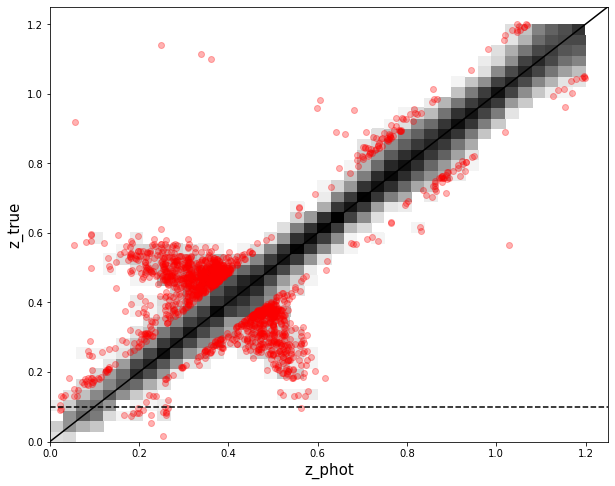

In [1384]:
gey = np.array(grey)
gey[: , 1]
tx = np.where( gey[: , 1] > 0.0 )[0]
plt.rcParams['figure.figsize'] = [10,8] 

plt.hist2d( gey[:, 1][tx], gey[:, 0][tx], bins=100, range=[[0.0,3.0],[0.0,3.0]], norm=LogNorm(clip=True), \
            cmin=1, cmap='Greys');
plt.xlabel('z_phot',fontsize=15);plt.ylabel('z_true',fontsize=15)
plt.plot(red.z_phot,red.z_true,'o',alpha=0.3,c='r')
plt.plot([0.0,3.0],[0.0,3.0],color='black')
plt.xlim(0.,1.25)
plt.ylim(0.0,1.25)
plt.axhline(0.1,linestyle='--',color='black')

In [1385]:
display_side_by_side(grey,red)

,z_true,z_phot,COR_val
0,0.014823,0.252435,-2.376120e-01
1,0.017027,0.055589,-3.856200e-02
2,0.017182,0.022209,-5.027000e-03
3,0.017908,0.020425,-2.517000e-03
4,0.018077,0.023789,-5.712000e-03
5,0.020265,0.075824,-5.555900e-02
6,0.021897,0.054505,-3.260800e-02
7,0.022575,0.023696,-1.121000e-03
8,0.022770,0.034084,-1.131400e-02
9,0.023061,0.054966,-3.190500e-02
